# **IMPORTING LIBRARIES AND DATASET**

In [1]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 3.6 MB/s eta 0:00:00


In [2]:
# Standard imports for data handling and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn imports for model evaluation, preprocessing, and classifiers
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import BaggingClassifier
from sklearn.decomposition import PCA

# Imbalanced-learn imports for handling class imbalance
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# Optuna for hyperparameter tuning
import optuna




# Load your dataset (replace the path with your actual dataset path)
df = pd.read_excel('/content/Dry_Bean_Dataset.xlsx')  # Example path to the dataset
# Clean data by dropping rows with missing values
df_cleaned = df.dropna()




# **DATA VISUALISATION AND EXPLORATION**

    Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  28395    610.291       208.178117       173.888747      1.197191   
1  28734    638.018       200.524796       182.734419      1.097356   

   Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
0      0.549812       28715     190.141097  0.763923  0.988856   0.958027   
1      0.411785       29172     191.272750  0.783968  0.984986   0.887034   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  Class  
0     0.913358      0.007332      0.003147      0.834222      0.998724  SEKER  
1     0.953861      0.006979      0.003564      0.909851      0.998430  SEKER  
                Area     Perimeter  MajorAxisLength  MinorAxisLength  \
count   13611.000000  13611.000000     13611.000000     13611.000000   
mean    53048.284549    855.283459       320.141867       202.270714   
std     29324.095717    214.289696        85.694186        44.970091   
min     20420.000000    52

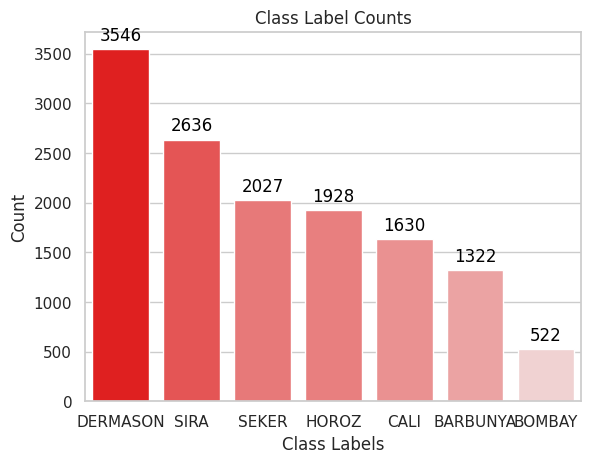

      Class  count
0     SEKER   3546
1  BARBUNYA   3546
2    BOMBAY   3546
3      CALI   3546
4     HOROZ   3546
5      SIRA   3546
6  DERMASON   3546


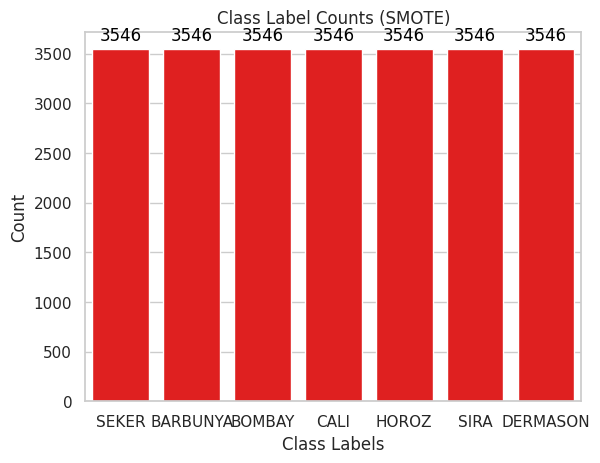

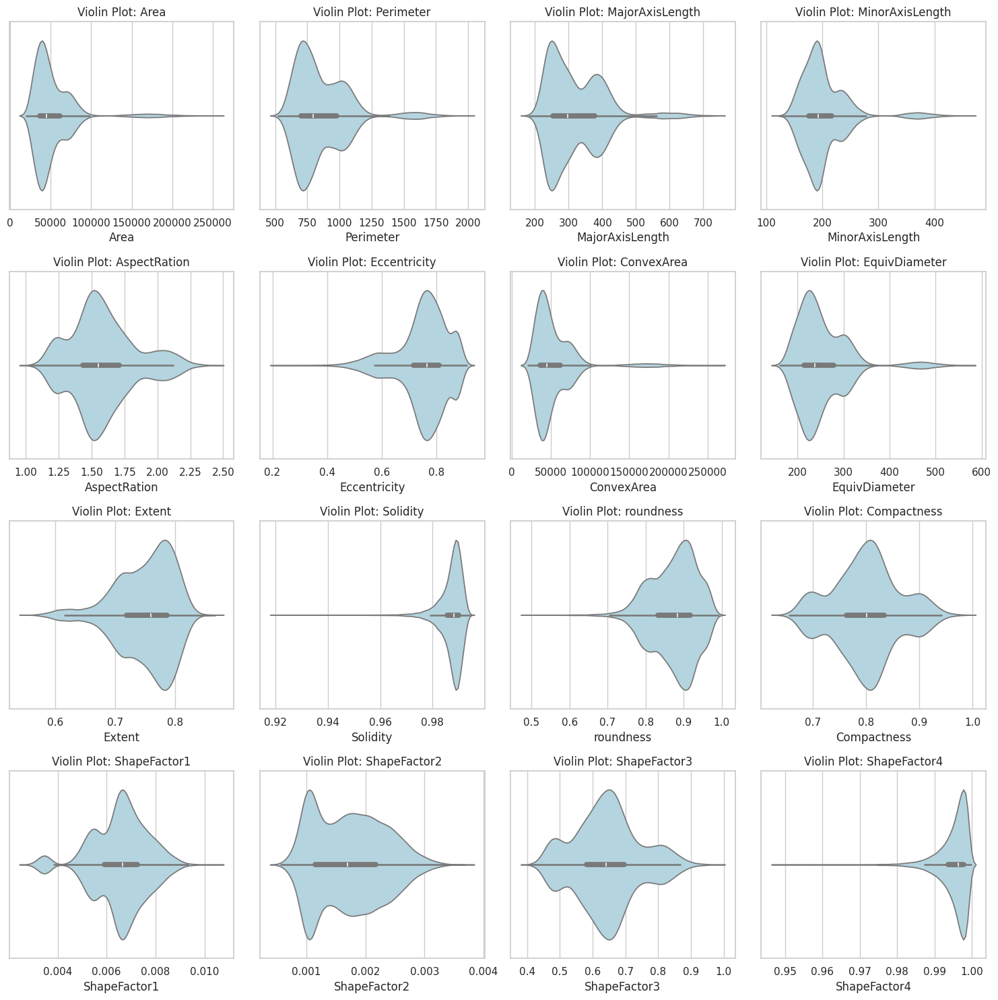

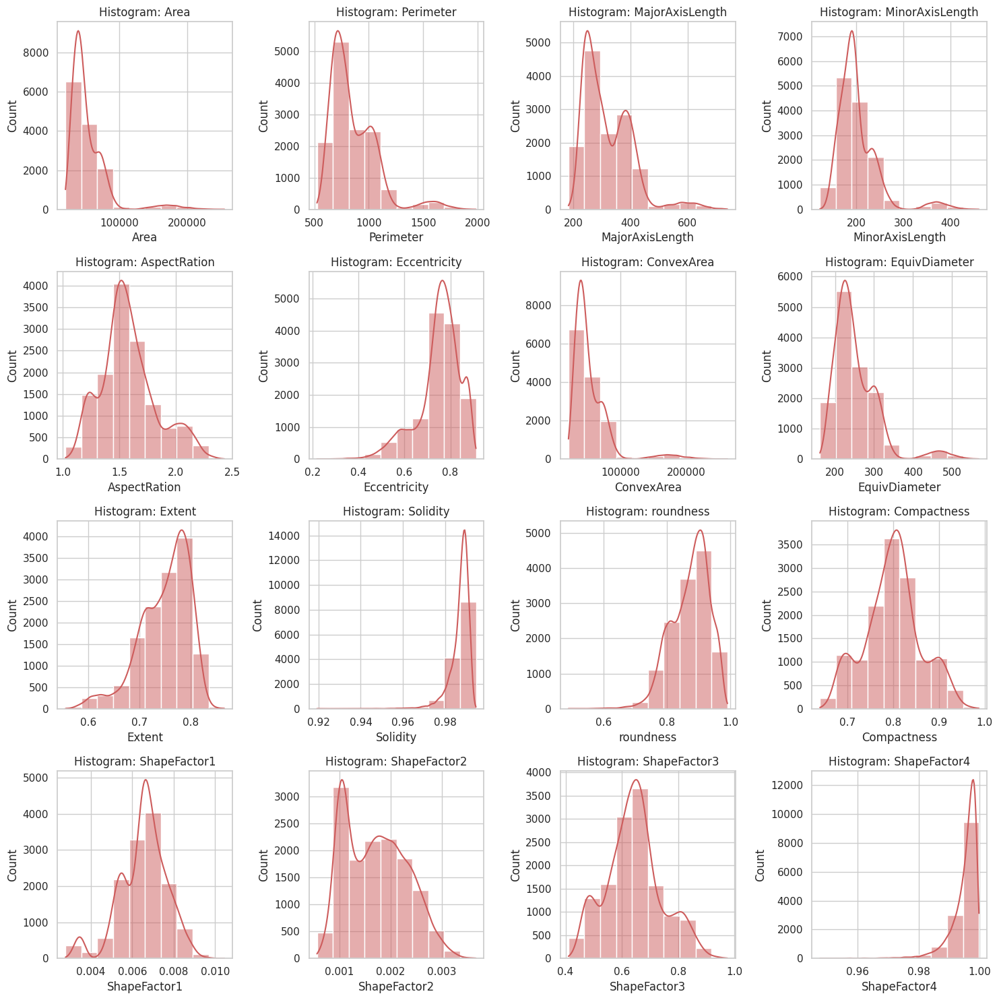

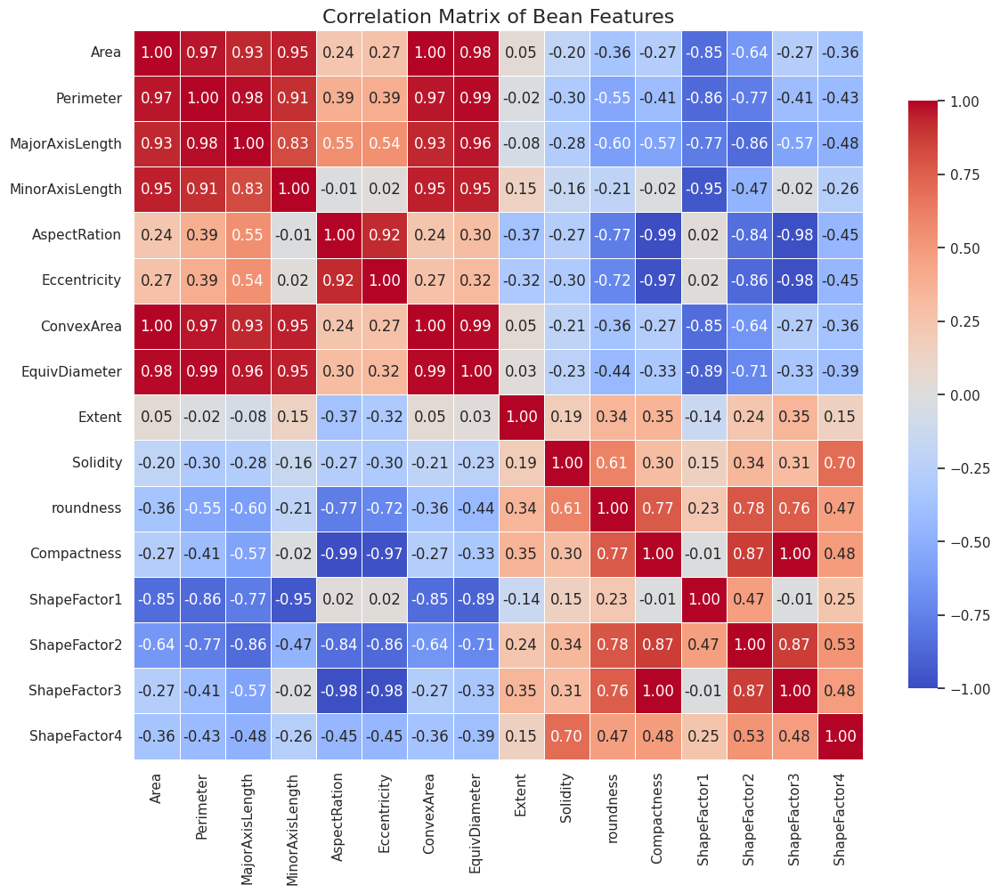

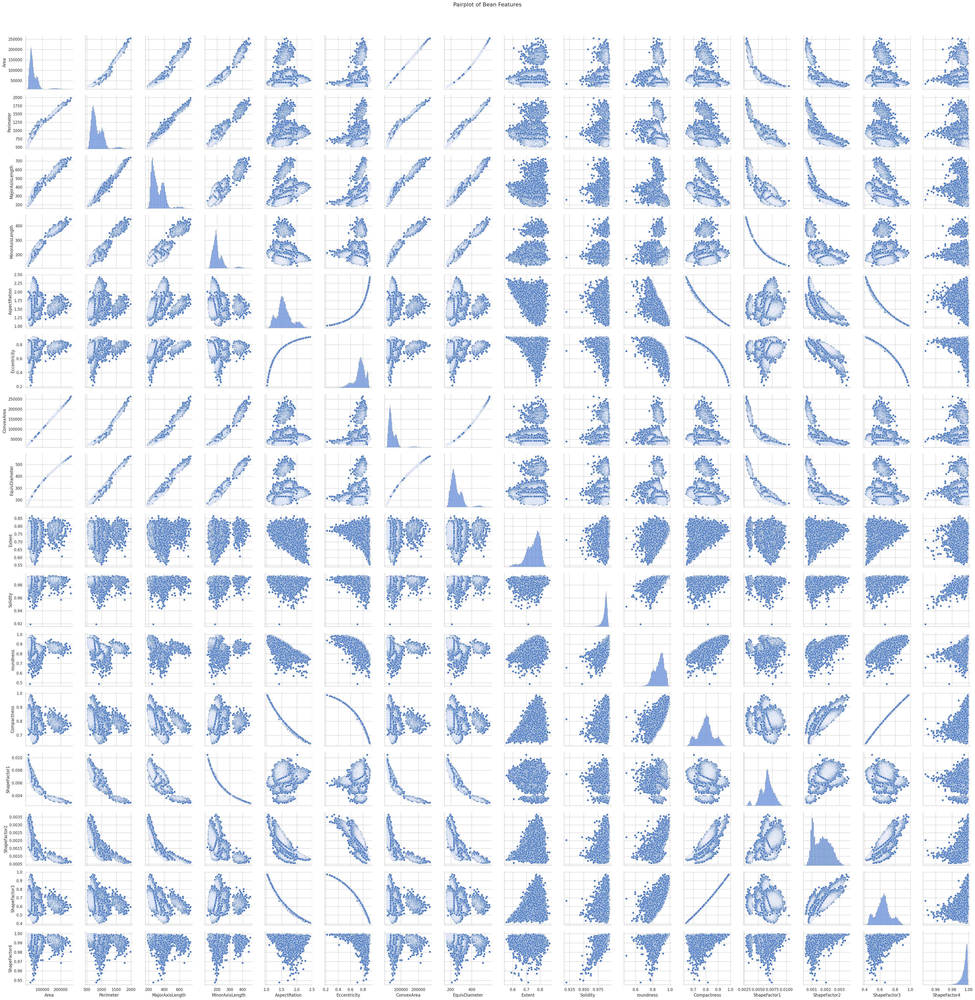

In [26]:


# Sanity check for the first 2 rows
print(df[:2])


# Describe the cleaned data
print(df.describe())

# Visualising number of class records
sns.set_theme(style='whitegrid', palette='muted')  # Setting theme and color palette

# Computing the occurrences of each class
class_counts = df['Class'].value_counts().reset_index()  # Creating a new df with counts and class labels
class_counts = class_counts.sort_values(by='count', ascending=False)  # Sorting based on occurrences
print(class_counts)

# Creating a gradient colour palette
palette = sns.light_palette("red", as_cmap=True)

# Mapping it onto each count
colours = [palette(count / max(class_counts['count'])) for count in class_counts['count']]

# Plotting the barplot
imbalance_plot = sns.barplot(x='Class', y='count', data=class_counts, palette=colours, hue='Class', legend=False)

# Adding labels for each column
for p in imbalance_plot.patches:
    imbalance_plot.annotate(f'{int(p.get_height())}',  # The height (count) of the bar
                            (p.get_x() + p.get_width() / 2, p.get_height()),  # Positioning the label
                            ha='center', va='center',  # Horizontal and vertical alignment
                            fontsize=12, color='black',  # Font size and color
                            xytext=(0, 10), textcoords='offset points')  # Offset to place label above bar

# Title and labels for the bar plot
plt.title("Class Label Counts")
plt.xlabel("Class Labels")
plt.ylabel("Count")
plt.show()

# Make a copy of the original dataframe
df_smote = df.copy()

# Step 1: Apply SMOTE to balance the class distribution
X_smote = df_smote.iloc[:, :-1]  # Features (all except the target)
y_smote = df_smote.iloc[:, -1]   # Target (Class)

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to generate synthetic samples
X_resampled, y_resampled = smote.fit_resample(X_smote, y_smote)

# Create a new DataFrame with the resampled data
df_smote_resampled = pd.DataFrame(X_resampled, columns=X_smote.columns)
df_smote_resampled['Class'] = y_resampled

# Visualising number of class records in the resampled data
sns.set_theme(style='whitegrid', palette='muted')  # Setting theme and color palette

# Computing the occurrences of each class in the resampled data
class_counts_smote = df_smote_resampled['Class'].value_counts().reset_index()  # Creating a new df with counts and class labels
class_counts_smote = class_counts_smote.sort_values(by='count', ascending=False)  # Sorting based on occurrences
print(class_counts_smote)

# Creating a gradient colour palette
palette = sns.light_palette("red", as_cmap=True)

# Mapping it onto each count
colours = [palette(count / max(class_counts_smote['count'])) for count in class_counts_smote['count']]

# Plotting the barplot
imbalance_plot_smote = sns.barplot(x='Class', y='count', data=class_counts_smote, palette=colours, hue='Class', legend=False)

# Adding labels for each column
for p in imbalance_plot_smote.patches:
    imbalance_plot_smote.annotate(f'{int(p.get_height())}',  # The height (count) of the bar
                                (p.get_x() + p.get_width() / 2, p.get_height()),  # Positioning the label
                                ha='center', va='center',  # Horizontal and vertical alignment
                                fontsize=12, color='black',  # Font size and color
                                xytext=(0, 10), textcoords='offset points')  # Offset to place label above bar

# Title and labels for the bar plot
plt.title("Class Label Counts (SMOTE)")
plt.xlabel("Class Labels")
plt.ylabel("Count")
plt.show()


# Bean features for visualization
bean_features = df.iloc[:, :-1]  # Creating new df with only features for visualization

# Create a grid of subplots (4x4) for violin plots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Flatten axes array for easier iteration
axes = axes.flatten()

# Loop through each numeric feature and plot a violin plot on the respective subplot
for i, feature in enumerate(bean_features.columns):
    sns.violinplot(ax=axes[i], data=bean_features, x=feature, color='lightblue')
    axes[i].set_title(f"Violin Plot: {feature}")  # Set the title of each subplot

# Adjust layout and show the violin plot grid
plt.tight_layout()
plt.show()

# Create a grid of subplots (4x4) for histograms
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Flatten axes array for easier iteration
axes = axes.flatten()

# Loop through each numeric feature and plot a histogram on the respective subplot
for i, feature in enumerate(bean_features.columns):  # Use bean_features for histograms
    sns.histplot(bean_features[feature], ax=axes[i], kde=True, color='indianred', bins=10)
    axes[i].set_title(f"Histogram: {feature}")  # Set the title of each subplot

# Adjust layout and show the histogram grid
plt.tight_layout()
plt.show()

# Compute the correlation matrix
corr_matrix = bean_features.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1,
            square=True, linewidths=0.5, cbar_kws={"shrink": .8})

# Set title for the heatmap
plt.title('Correlation Matrix of Bean Features', fontsize=16)

# Display the heatmap
plt.tight_layout()
plt.show()

# Create a pairplot for all the features in bean_features
sns.pairplot(bean_features)

# Set the title for the entire pairplot
plt.suptitle('Pairplot of Bean Features', fontsize=16, y=1.02)  # Title above the grid

# Adjust layout for the pairplot
plt.tight_layout()
plt.show()


# **KNN MODEL**

### **KNN - DATA PREPROCESSING AND CLEANING**

In [22]:
# Columns to drop for K-NN
columns_to_drop_knn = [
    'Perimeter', 'MajorAxisLength', 'EquivDiameter',
    'ConvexArea', 'ShapeFactor3', 'ShapeFactor2', 'roundness', 'ShapeFactor1',
]

# Drop the specified columns
df_cleaned_knn = df_cleaned.drop(columns=columns_to_drop_knn)

# Step 2: Split features and target labels
df_cleaned_features_knn = df_cleaned_knn.iloc[:, :-1]
df_cleaned_labels_knn = df_cleaned_knn.iloc[:, -1:]  # Features and labels
X_knn = df_cleaned_features_knn  # Features
y_knn = df_cleaned_labels_knn.values.ravel()  # Convert y to 1D array

# Step 3: Define features to check for outliers
features_to_check_knn = [
    'Solidity', 'AspectRation',
    'ShapeFactor4', 'Compactness', 'Eccentricity',
]

outlier_indices_knn = set()  # To store indices of rows to be removed

# Step 4: Calculate outlier bounds for all features independently
outlier_bounds_knn = {}

for feature in features_to_check_knn:
    Q1_knn = X_knn[feature].quantile(0.25)
    Q3_knn = X_knn[feature].quantile(0.75)
    IQR_knn = Q3_knn - Q1_knn
    lower_bound_knn = Q1_knn - 2 * IQR_knn
    upper_bound_knn = Q3_knn + 2 * IQR_knn
    outlier_bounds_knn[feature] = (lower_bound_knn, upper_bound_knn)

# Step 5: Identify and track outliers
for feature, (lower_bound_knn, upper_bound_knn) in outlier_bounds_knn.items():
    outliers_knn = (X_knn[feature] < lower_bound_knn) | (X_knn[feature] > upper_bound_knn)
    feature_outliers_knn = X_knn[outliers_knn].index
    outlier_indices_knn.update(feature_outliers_knn)

# Step 6: Remove outliers (rows identified as outliers for any feature)
X_cleaned_knn = X_knn.drop(index=outlier_indices_knn)
y_cleaned_knn = np.delete(y_knn, list(outlier_indices_knn))

# Step 9: Split the cleaned dataset into features and labels
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_cleaned_knn, y_cleaned_knn, test_size=0.25, random_state=42)

# Step 10: Separate the 'Area' feature for scaling
area_train_knn = X_train_knn[['Area']]
area_test_knn = X_test_knn[['Area']]

# Step 11: Apply log transformation to the selected features (for skewed features)
log_transformed_features = ['Solidity', 'AspectRation', 'ShapeFactor4', 'Compactness', 'Eccentricity']

# Apply log transformation to the features that need it (add 1 to avoid log(0) issues)
X_train_knn[log_transformed_features] = X_train_knn[log_transformed_features].apply(lambda x: np.log(x + 1))
X_test_knn[log_transformed_features] = X_test_knn[log_transformed_features].apply(lambda x: np.log(x + 1))

# Step 12: Apply StandardScaler to the 'Area' feature
scaler_area_knn = StandardScaler()
area_train_scaled_knn = scaler_area_knn.fit_transform(area_train_knn)
area_test_scaled_knn = scaler_area_knn.transform(area_test_knn)

# Step 13: Exclude the 'Area' feature and apply RobustScaler to the remaining features
features_train_knn = X_train_knn.drop(columns=['Area'])
features_test_knn = X_test_knn.drop(columns=['Area'])

scaler_robust_knn = RobustScaler()
features_train_scaled_knn = scaler_robust_knn.fit_transform(features_train_knn)
features_test_scaled_knn = scaler_robust_knn.transform(features_test_knn)

# Step 14: Combine the scaled features back into a DataFrame
X_train_scaled_knn = pd.DataFrame(features_train_scaled_knn, columns=features_train_knn.columns)
X_train_scaled_knn['Area'] = area_train_scaled_knn

X_test_scaled_knn = pd.DataFrame(features_test_scaled_knn, columns=features_test_knn.columns)
X_test_scaled_knn['Area'] = area_test_scaled_knn

### **PCA EXPLORATION**

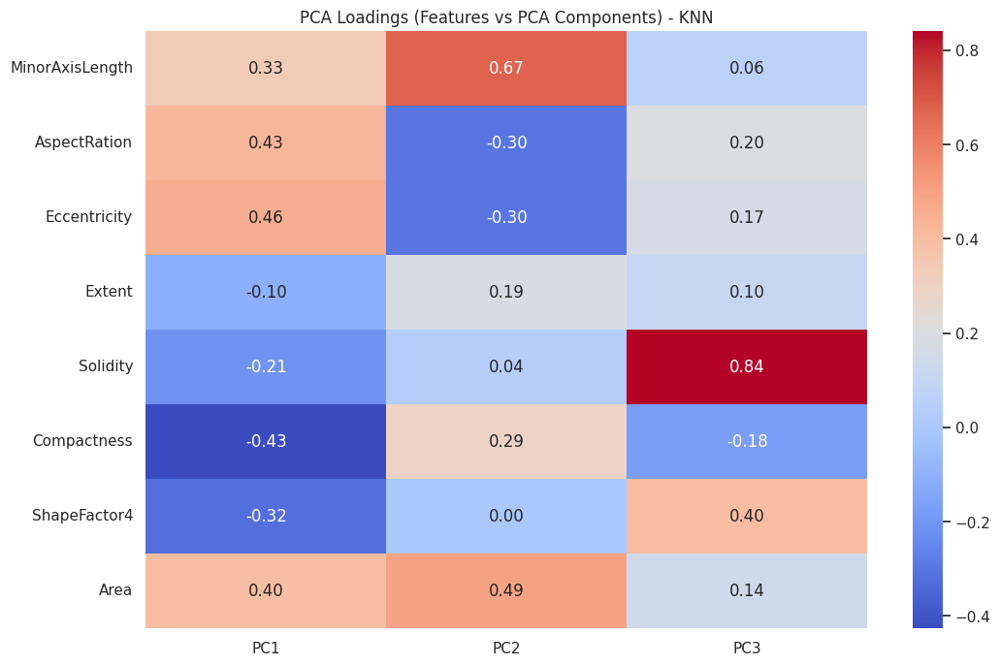

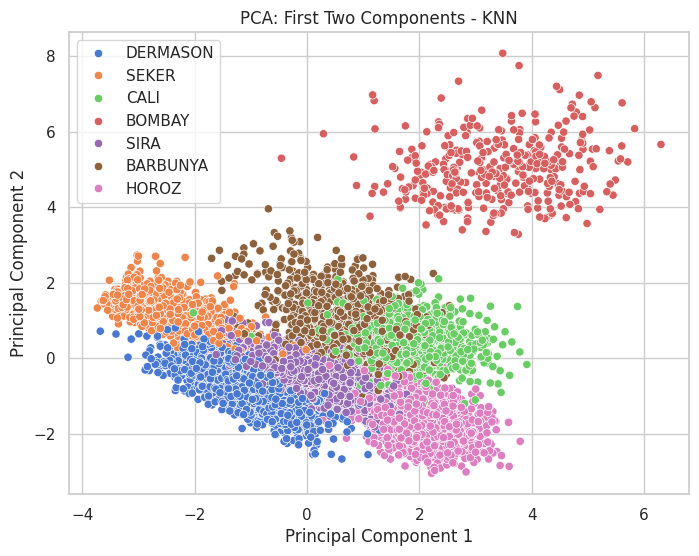

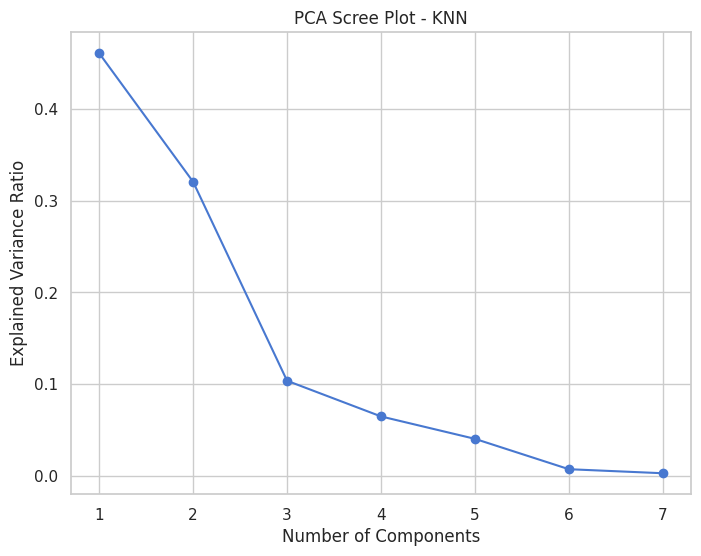

In [23]:
# PCA for loadings (3 components only for final visualization)
pca_knn = PCA(n_components=3)  # Use top 3 components for visualization
X_train_pca_knn = pca_knn.fit_transform(X_train_scaled_knn)

# Get the loadings (components)
loadings_knn = pca_knn.components_.T  # Transpose to match features with loadings
loadings_df_knn = pd.DataFrame(loadings_knn, columns=[f'PC{i+1}' for i in range(3)], index=X_train_scaled_knn.columns)

# Plotting the loadings
plt.figure(figsize=(12, 8))
sns.heatmap(loadings_df_knn, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('PCA Loadings (Features vs PCA Components) - KNN')
plt.show()

# Optional scatter plot for first two PCA components
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_train_pca_knn[:, 0], y=X_train_pca_knn[:, 1], hue=y_train_knn.squeeze())
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: First Two Components - KNN')
plt.legend()
plt.show()

# PCA Scree Plot (1 to 7 components)
pca_full_knn = PCA(n_components=7)
pca_full_knn.fit(X_train_scaled_knn)

# Plotting the explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(range(1, 8), pca_full_knn.explained_variance_ratio_, marker='o')
plt.title('PCA Scree Plot - KNN')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()




KNN without PCA

### **KNN MODEL AND BUILDING AND PERFORMANCE EVALUATION**

Accuracy for k values from 1 to 25 (KNN):
k=1: 0.8746
k=2: 0.8772
k=3: 0.8900
k=4: 0.8948
k=5: 0.8977
k=6: 0.9001
k=7: 0.9001
k=8: 0.9011
k=9: 0.9039
k=10: 0.9040
k=11: 0.9013
k=12: 0.9028
k=13: 0.9025
k=14: 0.9036
k=15: 0.9036
k=16: 0.9042
k=17: 0.9043
k=18: 0.9061
k=19: 0.9056
k=20: 0.9054
k=21: 0.9063
k=22: 0.9073
k=23: 0.9067
k=24: 0.9076
k=25: 0.9068


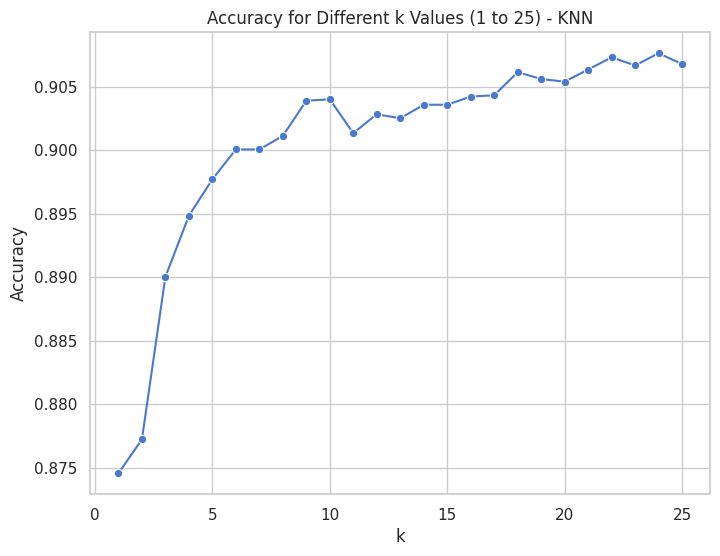

Mean cross-validation accuracy for k=22: 0.9073
Standard deviation of cross-validation accuracy for k=22: 0.0064

Test set classification report for k=22 (KNN):
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.85      0.91       300
      BOMBAY       1.00      1.00      1.00       124
        CALI       0.92      0.96      0.94       344
    DERMASON       0.91      0.93      0.92       852
       HOROZ       0.97      0.96      0.97       439
       SEKER       0.96      0.95      0.95       427
        SIRA       0.86      0.88      0.87       639

    accuracy                           0.92      3125
   macro avg       0.94      0.93      0.94      3125
weighted avg       0.93      0.92      0.92      3125


Final accuracy on test set for k=22: 0.9242


In [24]:

# Function to perform cross-validation and calculate mean accuracy for each k
def knn_cross_validation(X_train, y_train, k_range=(1, 26)):
    accuracies_per_k_knn = {}
    accuracies_best_k_knn = []

    # Step 1: Define the preprocessor
    preprocessor_knn = ColumnTransformer(
        transformers=[
            ('area', StandardScaler(), ['Area']),  # Scale 'Area' with StandardScaler
            ('other', RobustScaler(), [col for col in X_train.columns if col != 'Area'])  # Scale other features with RobustScaler
        ]
    )

    # Step 2: Define SMOTE
    smote_knn = SMOTE(random_state=42)

    # Step 3: Define the KNN classifier
    classifier_knn = KNeighborsClassifier()

    # Step 4: Create the pipeline
    pipeline_knn = ImbPipeline(steps=[
        ('preprocessor', preprocessor_knn),  # Apply feature-specific scaling
        ('smote', smote_knn),                # Handle imbalanced data with SMOTE
        ('classifier', classifier_knn)       # Train KNN classifier
    ])

    cv_knn = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for k_knn in range(k_range[0], k_range[1]):
        accuracies_knn = []

        for train_idx_knn, val_idx_knn in cv_knn.split(X_train, y_train):
            X_train_fold_knn, X_val_fold_knn = X_train.iloc[train_idx_knn], X_train.iloc[val_idx_knn]
            y_train_fold_knn, y_val_fold_knn = y_train[train_idx_knn], y_train[val_idx_knn]

            # Set the current k value in the classifier
            pipeline_knn.set_params(classifier__n_neighbors=k_knn)

            # Fit the pipeline
            pipeline_knn.fit(X_train_fold_knn, y_train_fold_knn)

            # Make predictions
            y_pred_fold_knn = pipeline_knn.predict(X_val_fold_knn)

            # Calculate accuracy
            accuracy_knn = accuracy_score(y_val_fold_knn, y_pred_fold_knn)
            accuracies_knn.append(accuracy_knn)

            # Track accuracies for k=22
            if k_knn == 22:
                accuracies_best_k_knn.append(accuracy_knn)

        # Store the mean accuracy for the current k
        accuracies_per_k_knn[k_knn] = np.mean(accuracies_knn)

    return accuracies_per_k_knn, accuracies_best_k_knn


# Perform cross-validation for k=1 to 20
accuracies_per_k_knn, accuracies_best_k_knn = knn_cross_validation(X_train_scaled_knn, y_train_knn)

# Print accuracies for k=1 to 20
print("Accuracy for k values from 1 to 25 (KNN):")
for k_knn, accuracy_knn in accuracies_per_k_knn.items():
    print(f"k={k_knn}: {accuracy_knn:.4f}")

# Plot the accuracy for k=1 to 25
plt.figure(figsize=(8, 6))
sns.lineplot(x=list(accuracies_per_k_knn.keys()), y=list(accuracies_per_k_knn.values()), marker='o')
plt.title('Accuracy for Different k Values (1 to 25) - KNN')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Calculate mean accuracy and standard deviation for k=22
mean_accuracy_best_k_knn = np.mean(accuracies_best_k_knn)
std_accuracy_best_k_knn = np.std(accuracies_best_k_knn)

# Print mean accuracy and standard deviation for k=22
print(f"Mean cross-validation accuracy for k=22: {mean_accuracy_best_k_knn:.4f}")
print(f"Standard deviation of cross-validation accuracy for k=22: {std_accuracy_best_k_knn:.4f}")

# Final testing using k=16 on the test set
best_knn_knn = KNeighborsClassifier(n_neighbors=22)
best_knn_knn.fit(X_train_scaled_knn, y_train_knn)

# Predict on the test set
y_pred_test_knn = best_knn_knn.predict(X_test_scaled_knn)

# Print classification report for the test set
print("\nTest set classification report for k=22 (KNN):")
print(classification_report(y_test_knn, y_pred_test_knn))

# Final accuracy on test set
final_accuracy_knn = accuracy_score(y_test_knn, y_pred_test_knn)
print(f"\nFinal accuracy on test set for k=22: {final_accuracy_knn:.4f}")


KNN with PCA

Accuracy for k values from 1 to 25 (KNN with PCA):
k=1: 0.8381
k=2: 0.8361
k=3: 0.8547
k=4: 0.8560
k=5: 0.8626
k=6: 0.8649
k=7: 0.8700
k=8: 0.8705
k=9: 0.8720
k=10: 0.8740
k=11: 0.8739
k=12: 0.8751
k=13: 0.8767
k=14: 0.8774
k=15: 0.8783
k=16: 0.8795
k=17: 0.8807
k=18: 0.8795
k=19: 0.8802
k=20: 0.8812
k=21: 0.8816
k=22: 0.8818
k=23: 0.8809
k=24: 0.8812
k=25: 0.8812


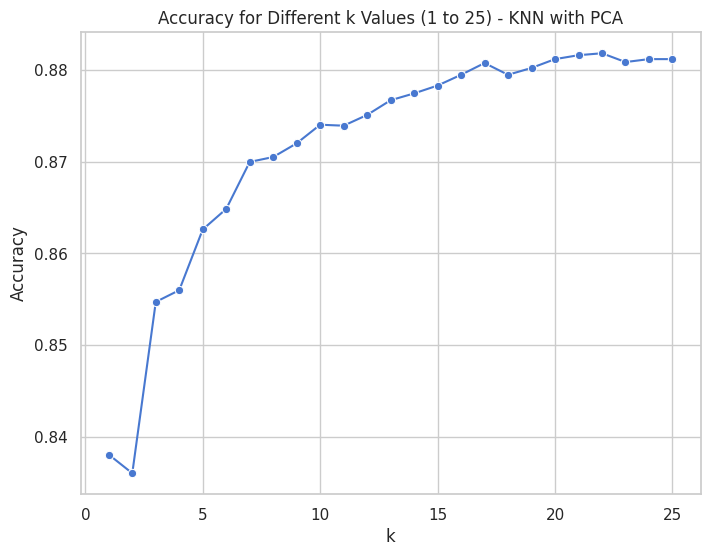

Mean cross-validation accuracy for k=22: 0.8818
Standard deviation of cross-validation accuracy for k=22: 0.0050

Test set classification report for k=22 (KNN with PCA):
              precision    recall  f1-score   support

    BARBUNYA       0.83      0.71      0.76       300
      BOMBAY       1.00      1.00      1.00       124
        CALI       0.84      0.90      0.87       344
    DERMASON       0.87      0.89      0.88       852
       HOROZ       0.96      0.94      0.95       439
       SEKER       0.93      0.91      0.92       427
        SIRA       0.78      0.80      0.79       639

    accuracy                           0.87      3125
   macro avg       0.89      0.88      0.88      3125
weighted avg       0.87      0.87      0.87      3125


Final accuracy on test set for k=22 (with PCA): 0.8707


In [25]:
# Function to perform cross-validation and calculate mean accuracy for each k
def knn_cross_validation_with_pca(X_train, y_train, k_range=(1, 26)):
    accuracies_per_k_knn = {}
    accuracies_best_k_knn = []

     # Step 1: Define the preprocessor
    preprocessor_knn = ColumnTransformer(
        transformers=[
            ('area', StandardScaler(), ['Area']),  # Scale 'Area' with StandardScaler
            ('other', RobustScaler(), [col for col in X_train.columns if col != 'Area'])  # Scale other features with RobustScaler
        ]
    )

    # Step 2: Define PCA
    pca_knn = PCA(n_components=3)  # Apply PCA to reduce features to 2 components

    # Step 3: Define SMOTE
    smote_knn = SMOTE(random_state=42)

    # Step 4: Define the KNN classifier
    classifier_knn = KNeighborsClassifier()

    # Step 5: Create the pipeline
    pipeline_knn = ImbPipeline(steps=[
        ('preprocessor', preprocessor_knn),  # Apply feature-specific scaling
        ('pca', pca_knn),                    # Perform dimensionality reduction
        ('smote', smote_knn),                # Handle imbalanced data with SMOTE
        ('classifier', classifier_knn)       # Train KNN classifier
    ])


    # Stratified K-Fold for cross-validation
    cv_knn = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Iterate over k values
    for k_knn in range(k_range[0], k_range[1]):
        accuracies_knn = []

        # Perform cross-validation
        for train_idx_knn, val_idx_knn in cv_knn.split(X_train, y_train):
            X_train_fold_knn, X_val_fold_knn = X_train.iloc[train_idx_knn], X_train.iloc[val_idx_knn]
            y_train_fold_knn, y_val_fold_knn = y_train[train_idx_knn], y_train[val_idx_knn]

            # Set current k value in the classifier
            pipeline_knn.set_params(classifier__n_neighbors=k_knn)

            # Fit the pipeline
            pipeline_knn.fit(X_train_fold_knn, y_train_fold_knn)

            # Make predictions
            y_pred_fold_knn = pipeline_knn.predict(X_val_fold_knn)

            # Calculate accuracy
            accuracy_knn = accuracy_score(y_val_fold_knn, y_pred_fold_knn)
            accuracies_knn.append(accuracy_knn)

            # Track accuracies for k=16
            if k_knn == 22:
                accuracies_best_k_knn.append(accuracy_knn)

        # Store the mean accuracy for the current k
        accuracies_per_k_knn[k_knn] = np.mean(accuracies_knn)

    return accuracies_per_k_knn, accuracies_best_k_knn


# Perform cross-validation using PCA for k=1 to 25
accuracies_per_k_knn, accuracies_best_k_knn = knn_cross_validation_with_pca(X_train_knn, y_train_knn)

# Print accuracies for k=1 to 25
print("Accuracy for k values from 1 to 25 (KNN with PCA):")
for k_knn, accuracy_knn in accuracies_per_k_knn.items():
    print(f"k={k_knn}: {accuracy_knn:.4f}")

# Plot accuracy for k=1 to 25
plt.figure(figsize=(8, 6))
sns.lineplot(x=list(accuracies_per_k_knn.keys()), y=list(accuracies_per_k_knn.values()), marker='o')
plt.title('Accuracy for Different k Values (1 to 25) - KNN with PCA')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Calculate mean accuracy and standard deviation for k=16
mean_accuracy_best_k_knn = np.mean(accuracies_best_k_knn)
std_accuracy_best_k_knn = np.std(accuracies_best_k_knn)

# Print mean accuracy and standard deviation for k=22
print(f"Mean cross-validation accuracy for k=22: {mean_accuracy_best_k_knn:.4f}")
print(f"Standard deviation of cross-validation accuracy for k=22: {std_accuracy_best_k_knn:.4f}")

# Final testing using k=22 on the test set
best_knn_pca = ImbPipeline(steps=[
    ('preprocessor', ColumnTransformer(transformers=[
        ('num', StandardScaler(), X_train_knn.columns)
    ])),
    ('pca', PCA(n_components=3)),  # Apply PCA with 3 components
    ('classifier', KNeighborsClassifier(n_neighbors=22))
])

# Fit the pipeline on the entire training set
best_knn_pca.fit(X_train_knn, y_train_knn)

# Predict on the test set
y_pred_test_knn_pca = best_knn_pca.predict(X_test_knn)

# Print classification report for the test set
print("\nTest set classification report for k=22 (KNN with PCA):")
print(classification_report(y_test_knn, y_pred_test_knn_pca))

# Final accuracy on test set
final_accuracy_knn_pca = accuracy_score(y_test_knn, y_pred_test_knn_pca)
print(f"\nFinal accuracy on test set for k=22 (with PCA): {final_accuracy_knn_pca:.4f}")



# **SVM**

### **SVM - DATA PREPROCESSING AND CLEANING**

In [27]:
# Step 1: Columns to drop for SVM
columns_to_drop_svm = [
    'Perimeter', 'MajorAxisLength', 'EquivDiameter',
    'ConvexArea',  'ShapeFactor3', 'ShapeFactor2',  'Compactness', 'Extent'
]

# Drop the specified columns
df_cleaned_svm = df_cleaned.drop(columns=columns_to_drop_svm)

# Step 2: Define the features to check for outliers and apply log transformation
features_to_transform_svm = [
    'Solidity', 'AspectRation', 'Eccentricity', 'roundness', 'ShapeFactor4', 'ShapeFactor1'
]

# Apply log transformation to selected features (adding a small constant to avoid log(0) issues)
for feature in features_to_transform_svm:
    df_cleaned_svm[feature] = np.log(df_cleaned_svm[feature] + 1)

# Step 3: Calculate outlier bounds for all features independently
outlier_indices_svm = set()  # To store indices of rows to be removed
outlier_bounds_svm = {}

for feature in features_to_transform_svm:
    Q1_svm = df_cleaned_svm[feature].quantile(0.25)
    Q3_svm = df_cleaned_svm[feature].quantile(0.75)
    IQR_svm = Q3_svm - Q1_svm
    lower_bound_svm = Q1_svm - 2 * IQR_svm
    upper_bound_svm = Q3_svm + 2 * IQR_svm
    outlier_bounds_svm[feature] = (lower_bound_svm, upper_bound_svm)

# Step 4: Identify outliers across features
X_svm = df_cleaned_svm.iloc[:, :-1]  # Features
y_svm = df_cleaned_svm.iloc[:, -1:]  # Labels

for feature, (lower_bound_svm, upper_bound_svm) in outlier_bounds_svm.items():
    outliers_svm = (X_svm[feature] < lower_bound_svm) | (X_svm[feature] > upper_bound_svm)
    feature_outliers_svm = X_svm[outliers_svm].index
    outlier_indices_svm.update(feature_outliers_svm)

# Step 5: Remove outliers from the dataset
X_cleaned_svm = X_svm.drop(index=outlier_indices_svm)
y_cleaned_svm = y_svm.drop(index=outlier_indices_svm)



### **SVM - MODEL BUILDING AND PERFORMANCE EVALUATION**

SVM WITHOUT PCA


Starting Optuna Tuning...
Best parameters (Optuna): {'C': 28.411199326888525, 'kernel': 'rbf', 'gamma': 0.04160628552957856}
Best accuracy (Optuna): 0.9235827562970537
Standard deviation of accuracy (Optuna): 0.1185298622377467
Best parameters (Optuna): {'C': 28.411199326888525, 'kernel': 'rbf', 'gamma': 0.04160628552957856}

Classification Report (Optuna):
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.93      0.94       301
      BOMBAY       1.00      1.00      1.00       106
        CALI       0.93      0.94      0.93       350
    DERMASON       0.93      0.92      0.92       876
       HOROZ       0.96      0.96      0.96       423
       SEKER       0.95      0.96      0.96       386
        SIRA       0.88      0.89      0.88       651

    accuracy                           0.93      3093
   macro avg       0.94      0.94      0.94      3093
weighted avg       0.93      0.93      0.93      3093

Final Accuracy (Optuna) on Test Set: 0.929

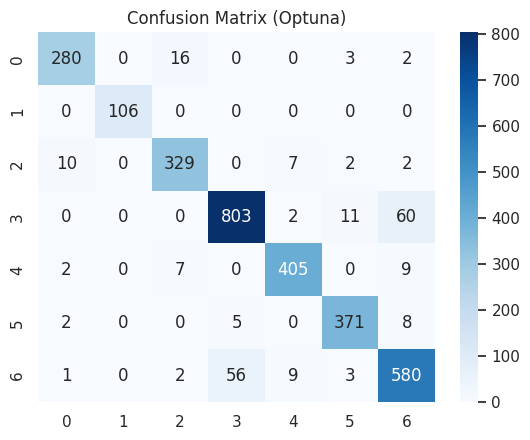

In [28]:


# Step 1: Train-test split (75% train, 25% test)
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(
    X_cleaned_svm, y_cleaned_svm, test_size=0.25, random_state=42, stratify=y_cleaned_svm
)

# Step 2: Define the preprocessor (same as before)
preprocessor_svm = ColumnTransformer(
    transformers=[
        ('area', StandardScaler(), ['Area']),  # Scale 'Area' with StandardScaler
        ('other', RobustScaler(), [col for col in X_cleaned_svm.columns if col != 'Area'])  # Scale other features with RobustScaler
    ])

# Step 3: Define SMOTE (same as before)
smote_svm = SMOTE(random_state=42)

# Step 4: Optuna Tuning
print("\nStarting Optuna Tuning...")

def objective(trial):
    # Suggest hyperparameters
    C = trial.suggest_float('C', 0.01, 100, log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf', 'poly'])
    gamma = trial.suggest_float('gamma', 0.001, 1, log=True) if kernel in ['rbf', 'poly'] else 'scale'
    degree = trial.suggest_int('degree', 2, 5) if kernel == 'poly' else 3

    # Define SVM model
    svm_model = SVC(C=C, kernel=kernel, gamma=gamma, degree=degree, random_state=42)

    # Define pipeline
    pipeline = ImbPipeline([
        ('preprocessing', preprocessor_svm),
        ('smote', smote_svm),
        ('svm', svm_model)
    ])

    # Perform Stratified K-Fold cross-validation (using the training set only)
    kf_svm = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_train_svm, y_train_svm.values.flatten(), cv=kf_svm, scoring='accuracy', n_jobs=-1)
    mean_accuracy = np.mean(scores)
    std_accuracy = np.std(scores)  # Standard deviation of accuracy

    return mean_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print("Best parameters (Optuna):", study.best_params)
best_mean_accuracy = study.best_value
best_std_accuracy = np.std([trial.value for trial in study.trials])
print("Best accuracy (Optuna):", best_mean_accuracy)
print("Standard deviation of accuracy (Optuna):", best_std_accuracy)
print("Best parameters (Optuna):", study.best_params)

# Step 5: Final Evaluation Using the Best Parameters (From Optuna)

# Optuna Model
best_optuna_params = study.best_params
final_optuna_model = SVC(
    C=best_optuna_params['C'],
    kernel=best_optuna_params['kernel'],
    gamma=best_optuna_params.get('gamma', 'scale'),
    degree=best_optuna_params.get('degree', 3),
    random_state=42
)
final_pipeline_optuna = ImbPipeline([
    ('preprocessing', preprocessor_svm),
    ('smote', smote_svm),
    ('svm', final_optuna_model)
])
final_pipeline_optuna.fit(X_train_svm, y_train_svm.values.flatten())  # Using .values.flatten() to convert y to 1D

# Prediction on Test Set
y_pred_optuna = final_pipeline_optuna.predict(X_test_svm)

# Evaluation on the Test Set
print("\nClassification Report (Optuna):")
print(classification_report(y_test_svm, y_pred_optuna))
final_optuna_accuracy = accuracy_score(y_test_svm, y_pred_optuna)
print(f"Final Accuracy (Optuna) on Test Set: {final_optuna_accuracy:.4f}")

# Confusion Matrix for Optuna Model
cm_optuna = confusion_matrix(y_test_svm, y_pred_optuna)
sns.heatmap(cm_optuna, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix (Optuna)")
plt.show()


SVM WITH PCA


Starting Optuna Tuning with PCA...
Best parameters (Optuna with PCA): {'C': 60.8425191623174, 'kernel': 'rbf', 'gamma': 0.056777083951497685, 'n_components': 7}
Best accuracy (Optuna with PCA): 0.9235826982061528
Standard deviation of accuracy (Optuna with PCA): 0.13344083598273362
Best parameters (Optuna with PCA): {'C': 60.8425191623174, 'kernel': 'rbf', 'gamma': 0.056777083951497685, 'n_components': 7}

Classification Report (Optuna with PCA):
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.93      0.94       301
      BOMBAY       1.00      1.00      1.00       106
        CALI       0.93      0.94      0.94       350
    DERMASON       0.93      0.92      0.93       876
       HOROZ       0.95      0.95      0.95       423
       SEKER       0.95      0.96      0.96       386
        SIRA       0.88      0.89      0.89       651

    accuracy                           0.93      3093
   macro avg       0.94      0.94      0.94      3093
weight

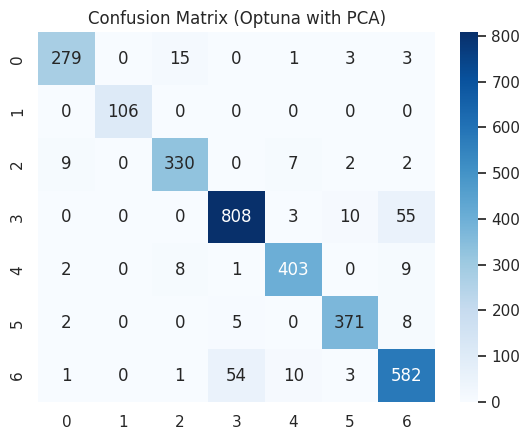

In [29]:
# Step 1: Train-test split (75% train, 25% test)
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(
    X_cleaned_svm, y_cleaned_svm, test_size=0.25, random_state=42, stratify=y_cleaned_svm
)

# Step 2: Define the preprocessor (same as before)
preprocessor_svm = ColumnTransformer(
    transformers=[
        ('area', StandardScaler(), ['Area']),  # Scale 'Area' with StandardScaler
        ('other', RobustScaler(), [col for col in X_cleaned_svm.columns if col != 'Area'])  # Scale other features with RobustScaler
    ])

# Step 3: Define SMOTE (same as before)
smote_svm = SMOTE(random_state=42)

# Step 4: Optuna Tuning with PCA
print("\nStarting Optuna Tuning with PCA...")

def objective(trial):
    # Suggest hyperparameters
    C = trial.suggest_float('C', 0.01, 100, log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf', 'poly'])
    gamma = trial.suggest_float('gamma', 0.001, 1, log=True) if kernel in ['rbf', 'poly'] else 'scale'
    degree = trial.suggest_int('degree', 2, 5) if kernel == 'poly' else 3
    n_components = trial.suggest_int('n_components', 2, min(X_cleaned_svm.shape[1], 20))  # Tune PCA components

    # Define SVM model
    svm_model = SVC(C=C, kernel=kernel, gamma=gamma, degree=degree, random_state=42)

    # Define pipeline with PCA
    pipeline = ImbPipeline([
        ('preprocessing', preprocessor_svm),
        ('smote', smote_svm),
        ('pca', PCA(n_components=n_components)),  # Include PCA with tuned n_components
        ('svm', svm_model)
    ])

    # Perform Stratified K-Fold cross-validation (using the training set only)
    kf_svm = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_train_svm, y_train_svm.values.flatten(), cv=kf_svm, scoring='accuracy', n_jobs=-1)
    mean_accuracy = np.mean(scores)
    std_accuracy = np.std(scores)  # Standard deviation of accuracy

    return mean_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print("Best parameters (Optuna with PCA):", study.best_params)
best_mean_accuracy = study.best_value
best_std_accuracy = np.std([trial.value for trial in study.trials])
print("Best accuracy (Optuna with PCA):", best_mean_accuracy)
print("Standard deviation of accuracy (Optuna with PCA):", best_std_accuracy)
print("Best parameters (Optuna with PCA):", study.best_params)

# Step 5: Final Evaluation Using the Best Parameters (From Optuna with PCA)

# Optuna Model
best_optuna_params = study.best_params
final_optuna_model = SVC(
    C=best_optuna_params['C'],
    kernel=best_optuna_params['kernel'],
    gamma=best_optuna_params.get('gamma', 'scale'),
    degree=best_optuna_params.get('degree', 3),
    random_state=42
)
final_pipeline_optuna = ImbPipeline([
    ('preprocessing', preprocessor_svm),
    ('smote', smote_svm),
    ('pca', PCA(n_components=best_optuna_params['n_components'])),  # Use best n_components from Optuna
    ('svm', final_optuna_model)
])
final_pipeline_optuna.fit(X_train_svm, y_train_svm.values.flatten())  # Using .values.flatten() to convert y to 1D

# Prediction on Test Set
y_pred_optuna = final_pipeline_optuna.predict(X_test_svm)

# Evaluation on the Test Set
print("\nClassification Report (Optuna with PCA):")
print(classification_report(y_test_svm, y_pred_optuna))
final_optuna_accuracy = accuracy_score(y_test_svm, y_pred_optuna)
print(f"Final Accuracy (Optuna with PCA) on Test Set: {final_optuna_accuracy:.4f}")

# Confusion Matrix for Optuna Model
cm_optuna = confusion_matrix(y_test_svm, y_pred_optuna)
sns.heatmap(cm_optuna, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix (Optuna with PCA)")
plt.show()


In [ ]:
#INITIAL GRID SEARCH CODE WHICH I DIDNT USE

# Step 3: Grid Search Tuning (Commented out as requested)
# print("Starting Grid Search...")
# param_grid = {
#     'svm__C': [0.1, 1, 10, 100],
#     'svm__kernel': ['linear', 'rbf', 'poly'],
#     'svm__gamma': ['scale', 'auto', 0.1, 0.01],
#     'svm__degree': [2, 3, 4]  # Only used for 'poly' kernel
# }
# svm_grid = SVC(random_state=42)
# pipeline_grid = ImbPipeline([
#     ('preprocessing', preprocessor_svm),
#     ('smote', smote_svm),
#     ('svm', svm_grid)
# ])
# kf_svm = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# grid_search = GridSearchCV(estimator=pipeline_grid, param_grid=param_grid, scoring='accuracy', cv=kf_svm, n_jobs=-1)
# grid_search.fit(X_cleaned_svm, y_cleaned_svm.ravel())  # Using .ravel() to convert y to 1D
# print("Best parameters (Grid Search):", grid_search.best_params_)
# print("Best accuracy (Grid Search):", grid_search.best_score_)

# **DECISION TREES**

### **DT - DATA PREPROCESSING AND CLEANING**

In [30]:


# Drop outliers as you already did
columns_to_drop_dt = ['Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea',
                      'ShapeFactor3', 'ShapeFactor2', 'Extent', 'roundness', 'ShapeFactor1']
df_cleaned_dt = df_cleaned.drop(columns=columns_to_drop_dt)

X_dt = df_cleaned_dt.iloc[:, :-1]
y_dt = df_cleaned_dt.iloc[:, -1]

features_to_check_dt = ['Solidity', 'AspectRation', 'ShapeFactor4', 'Compactness', 'Eccentricity']
outlier_indices_dt = set()

# Identify outliers and drop them
for feature in features_to_check_dt:
    Q1_dt = X_dt[feature].quantile(0.25)
    Q3_dt = X_dt[feature].quantile(0.75)
    IQR_dt = Q3_dt - Q1_dt
    lower_bound_dt = Q1_dt - 2 * IQR_dt
    upper_bound_dt = Q3_dt + 2 * IQR_dt
    outliers_dt = (X_dt[feature] < lower_bound_dt) | (X_dt[feature] > upper_bound_dt)
    outlier_indices_dt.update(X_dt[outliers_dt].index)

X_cleaned_dt = X_dt.drop(index=outlier_indices_dt)
y_cleaned_dt = y_dt.drop(index=outlier_indices_dt)

# Log transformation (apply only to positive values, and avoid log(0) by adding a small constant)
log_transform_features = ['Solidity', 'AspectRation', 'ShapeFactor4', 'Compactness', 'Eccentricity']
for feature in log_transform_features:
    # Add a small constant to avoid log(0) if necessary
    X_cleaned_dt[feature] = np.log(X_cleaned_dt[feature] + 1e-9)  # Using a small constant for safety

# Now X_cleaned_dt is log-transformed for the specified features


### **DT-MODEL BUILDING AND PERFORMANCE EVALUATION**

DT WITH PCA

Best hyperparameters: {'max_depth': 12, 'min_samples_split': 18, 'min_samples_leaf': 17, 'ccp_alpha': 0.00021692642774269846, 'max_features': None, 'min_impurity_decrease': 0.00010062498508556842, 'splitter': 'best', 'class_weight': None}
Best accuracy: 0.8797
Standard deviation of accuracy: 0.1868

Classification Report for the final model (Test Set):
              precision    recall  f1-score   support

    BARBUNYA       0.80      0.81      0.80       300
      BOMBAY       0.98      1.00      0.99       124
        CALI       0.85      0.83      0.84       344
    DERMASON       0.91      0.88      0.90       852
       HOROZ       0.95      0.96      0.95       439
       SEKER       0.92      0.95      0.94       427
        SIRA       0.82      0.85      0.84       639

    accuracy                           0.89      3125
   macro avg       0.89      0.90      0.89      3125
weighted avg       0.89      0.89      0.89      3125

Final accuracy on test set: 0.8861

Classificati

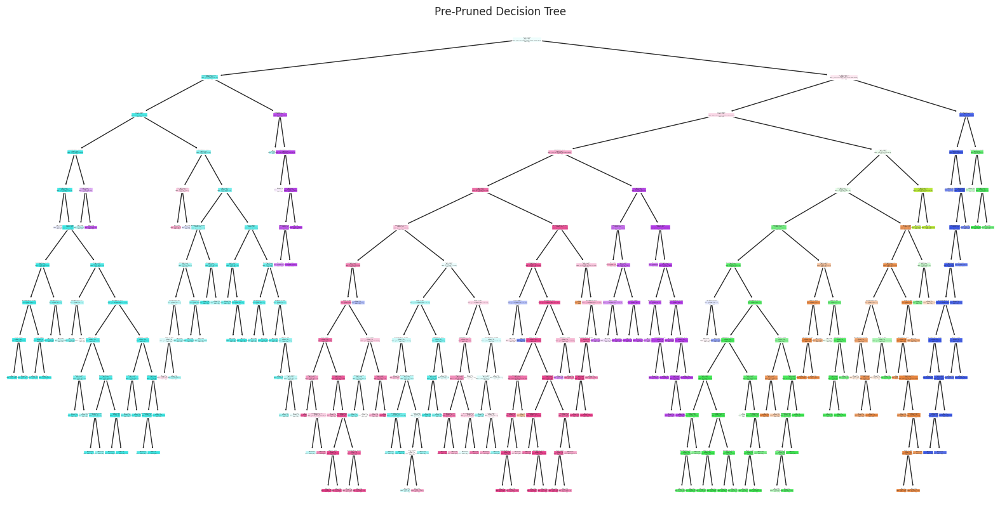

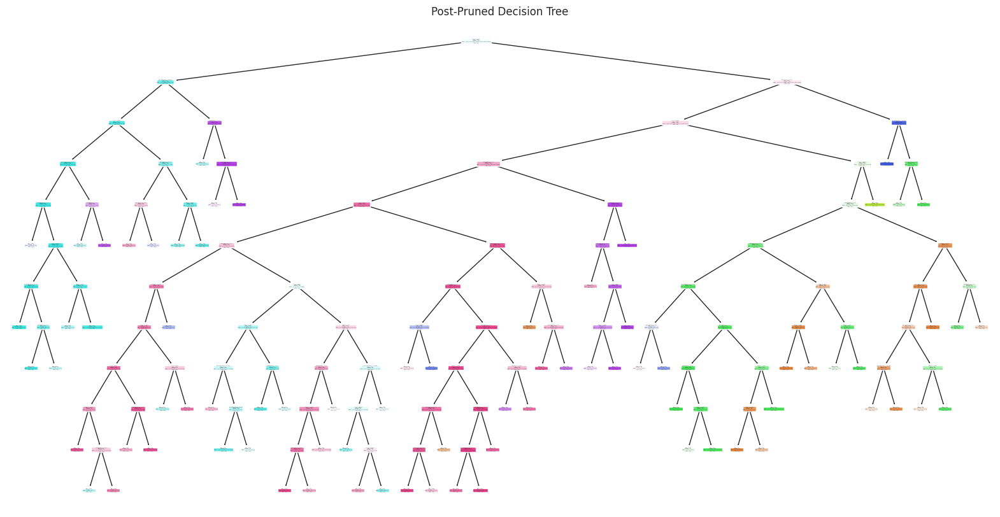

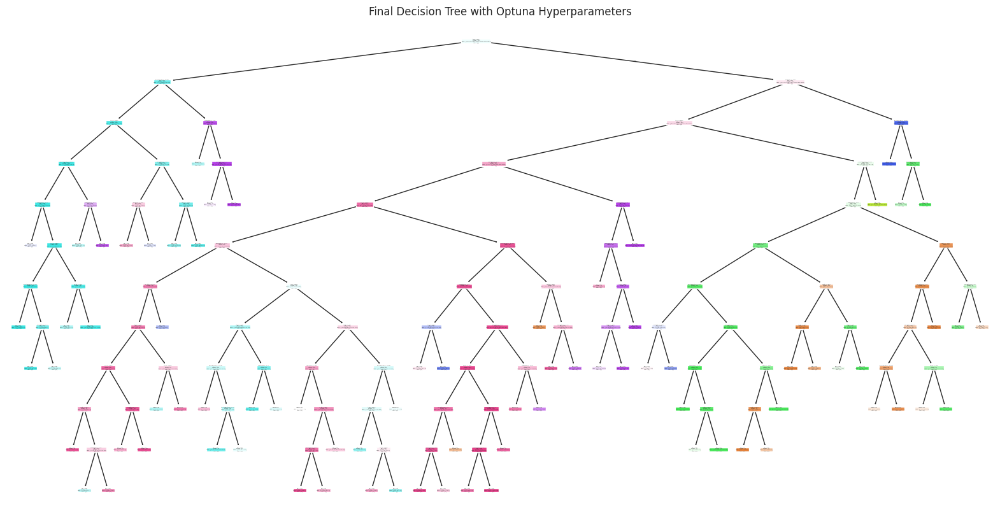

Final Accuracy of Pre-Pruned Decision Tree: 0.9056
Final Accuracy of Post-Pruned Decision Tree: 0.9059
Final Accuracy of Decision Tree with Optuna Hyperparameters: 0.8861


In [31]:

# 1. Split the data into training (75%) and testing (25%) sets
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_cleaned_dt, y_cleaned_dt, test_size=0.25, random_state=42)

# Suppress Optuna logs below WARNING level
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Function to train and evaluate models
def train_and_evaluate(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    return test_accuracy

# Function for Optuna to optimize the regularization parameters for Decision Tree
def objective(trial):
    # Suggest hyperparameters for DecisionTreeClassifier
    max_depth = trial.suggest_int('max_depth', 2, 20, log=True)  # Tune max depth
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    ccp_alpha = trial.suggest_float('ccp_alpha', 0.0001, 0.1, log=True)  # Cost complexity pruning parameter
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])  # Valid values
    min_impurity_decrease = trial.suggest_float('min_impurity_decrease', 0.0001, 0.1, log=True)  # Minimum decrease in impurity
    splitter = trial.suggest_categorical('splitter', ['best', 'random'])  # Strategy for splitting nodes
    class_weight = trial.suggest_categorical('class_weight', [None, 'balanced'])  # Class weighting for imbalanced classes

    # Define a DecisionTreeClassifier with regularization parameters
    dt_model = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        ccp_alpha=ccp_alpha,
        max_features=max_features,
        min_impurity_decrease=min_impurity_decrease,
        splitter=splitter,
        class_weight=class_weight,
        random_state=42
    )

    # Define pipeline
    pipeline = ImbPipeline([
        ('smote', SMOTE(random_state=42)),  # SMOTE for balancing class distribution
        ('pca', PCA(n_components=3)),       # PCA for dimensionality reduction
        ('classifier', dt_model)            # Use DecisionTreeClassifier (no bagging)
    ])

    # Perform Stratified K-Fold cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_train_dt, y_train_dt, cv=cv, scoring='accuracy', n_jobs=-1)

    mean_accuracy = np.mean(scores)
    std_accuracy = np.std(scores)  # Standard deviation of the accuracy
    return mean_accuracy  # Return the mean accuracy as the objective to maximize

# Create Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Optimize over 50 trials

# Print the best hyperparameters, best accuracy, and standard deviation
best_params = study.best_params
best_accuracy = study.best_value
# Get the standard deviation from the trials' results
best_std_accuracy = np.std([trial.value for trial in study.trials])

print(f"Best hyperparameters: {best_params}")
print(f"Best accuracy: {best_accuracy:.4f}")
print(f"Standard deviation of accuracy: {best_std_accuracy:.4f}")


# Plot the optimization results (for example, for max_depth)
optuna.visualization.plot_optimization_history(study)

# Train the final model using the best parameters found by Optuna
best_params = study.best_params
final_model = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    ccp_alpha=best_params['ccp_alpha'],
    max_features=best_params['max_features'],
    min_impurity_decrease=best_params['min_impurity_decrease'],
    splitter=best_params['splitter'],
    class_weight=best_params['class_weight'],
    random_state=42
)

# Final evaluation on the test set
pipeline_final = ImbPipeline([
    ('smote', SMOTE(random_state=42)),
    ('pca', PCA(n_components=3)),  # Ensure PCA transformation is applied consistently
    ('classifier', final_model)  # No bagging, just the final regularized decision tree
])

# Fit the final model and evaluate on the test set using the pipeline (which includes PCA and SMOTE)
pipeline_final.fit(X_train_dt, y_train_dt)
y_pred_test = pipeline_final.predict(X_test_dt)

# Print classification report for the test set
print("\nClassification Report for the final model (Test Set):")
print(classification_report(y_test_dt, y_pred_test))

# Calculate final accuracy on the test set
final_accuracy = accuracy_score(y_test_dt, y_pred_test)
print(f"Final accuracy on test set: {final_accuracy:.4f}")

# Train pre-pruned tree (based on pre-pruned hyperparameters)
pre_pruned_tree = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    random_state=42
)
pre_pruned_tree.fit(X_train_dt, y_train_dt)

# Evaluate pre-pruned tree on the test set
y_pred_pre_pruned = pre_pruned_tree.predict(X_test_dt)
pre_pruned_accuracy = accuracy_score(y_test_dt, y_pred_pre_pruned)
print("\nClassification Report for Pre-Pruned Decision Tree (Test Set):")
print(classification_report(y_test_dt, y_pred_pre_pruned))
print(f"Pre-Pruned Decision Tree Accuracy: {pre_pruned_accuracy:.4f}")

# Train post-pruned tree (based on ccp_alpha hyperparameter)
post_pruned_tree = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    ccp_alpha=best_params['ccp_alpha'],  # Post-pruning with cost complexity pruning
    random_state=42
)
post_pruned_tree.fit(X_train_dt, y_train_dt)

# Evaluate post-pruned tree on the test set
y_pred_post_pruned = post_pruned_tree.predict(X_test_dt)
post_pruned_accuracy = accuracy_score(y_test_dt, y_pred_post_pruned)
print("\nClassification Report for Post-Pruned Decision Tree (Test Set):")
print(classification_report(y_test_dt, y_pred_post_pruned))
print(f"Post-Pruned Decision Tree Accuracy: {post_pruned_accuracy:.4f}")

# Plot pre-pruned tree
plt.figure(figsize=(20, 10))
plot_tree(pre_pruned_tree, filled=True, feature_names=X_train_dt.columns, class_names=True)
plt.title("Pre-Pruned Decision Tree")
plt.show()

# Plot post-pruned tree
plt.figure(figsize=(20, 10))
plot_tree(post_pruned_tree, filled=True, feature_names=X_train_dt.columns, class_names=True)
plt.title("Post-Pruned Decision Tree")
plt.show()

# Final model: Train without the pipeline for visualization
final_model.fit(X_train_dt, y_train_dt)  # Re-train final model

# Plot final decision tree
plt.figure(figsize=(20, 10))
plot_tree(final_model, filled=True, feature_names=X_train_dt.columns, class_names=True)
plt.title("Final Decision Tree with Optuna Hyperparameters")
plt.show()

# Print final accuracies for all models
print(f"Final Accuracy of Pre-Pruned Decision Tree: {pre_pruned_accuracy:.4f}")
print(f"Final Accuracy of Post-Pruned Decision Tree: {post_pruned_accuracy:.4f}")
print(f"Final Accuracy of Decision Tree with Optuna Hyperparameters: {final_accuracy:.4f}")



DT WITHOUT PCA

Best hyperparameters: {'max_depth': 11, 'min_samples_split': 4, 'min_samples_leaf': 17, 'ccp_alpha': 0.00037309527807293256, 'max_features': None, 'min_impurity_decrease': 0.00017863493635722548, 'splitter': 'best', 'class_weight': None}
Best accuracy: 0.8974
Standard deviation of accuracy: 0.1859

Classification Report for the final model (Test Set):
              precision    recall  f1-score   support

    BARBUNYA       0.89      0.86      0.87       300
      BOMBAY       1.00      1.00      1.00       124
        CALI       0.89      0.92      0.90       344
    DERMASON       0.91      0.93      0.92       852
       HOROZ       0.94      0.97      0.95       439
       SEKER       0.92      0.96      0.94       427
        SIRA       0.89      0.81      0.85       639

    accuracy                           0.91      3125
   macro avg       0.92      0.92      0.92      3125
weighted avg       0.91      0.91      0.91      3125

Final accuracy on test set: 0.9101

Classificatio

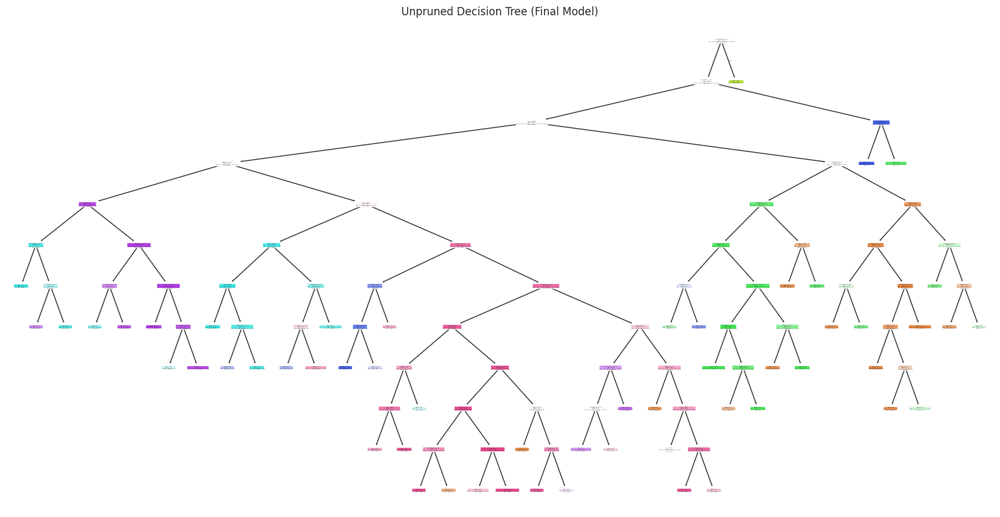

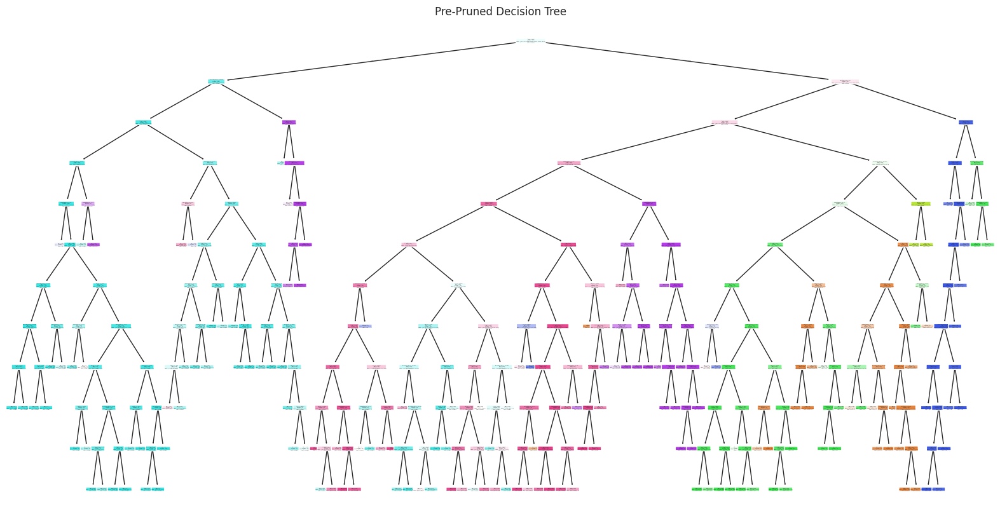

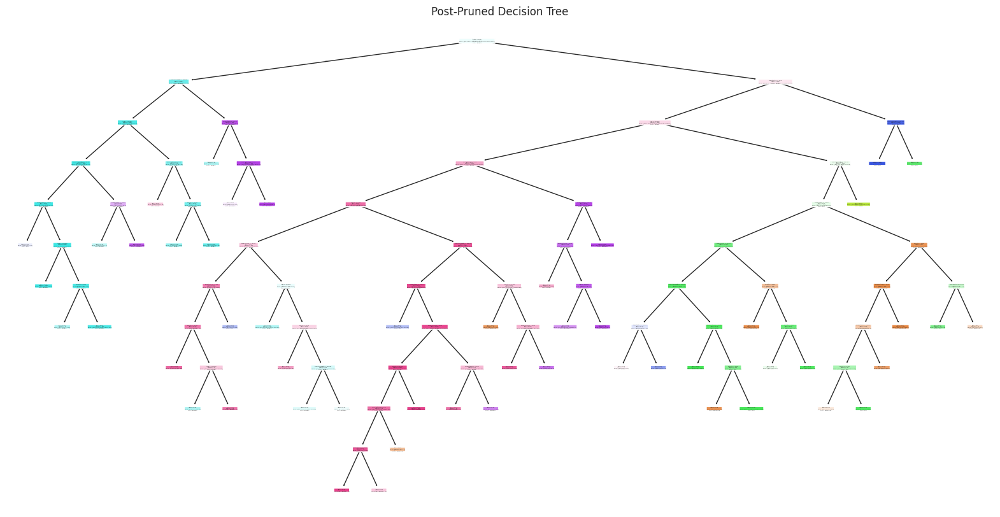

In [34]:
# 1. Split the data into training (75%) and testing (25%) sets
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_cleaned_dt, y_cleaned_dt, test_size=0.25, random_state=42)

# Suppress Optuna logs below WARNING level
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Function to train and evaluate models
def train_and_evaluate(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    return test_accuracy

# Function for Optuna to optimize the regularization parameters for Decision Tree
def objective(trial):
    # Suggest hyperparameters for DecisionTreeClassifier
    max_depth = trial.suggest_int('max_depth', 2, 20, log=True)  # Tune max depth
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    ccp_alpha = trial.suggest_float('ccp_alpha', 0.0001, 0.1, log=True)  # Cost complexity pruning parameter
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])  # Valid values
    min_impurity_decrease = trial.suggest_float('min_impurity_decrease', 0.0001, 0.1, log=True)  # Minimum decrease in impurity
    splitter = trial.suggest_categorical('splitter', ['best', 'random'])  # Strategy for splitting nodes
    class_weight = trial.suggest_categorical('class_weight', [None, 'balanced'])  # Class weighting for imbalanced classes

    # Define a DecisionTreeClassifier with regularization parameters
    dt_model = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        ccp_alpha=ccp_alpha,
        max_features=max_features,
        min_impurity_decrease=min_impurity_decrease,
        splitter=splitter,
        class_weight=class_weight,
        random_state=42
    )

    # Define pipeline
    pipeline = ImbPipeline([
        ('smote', SMOTE(random_state=42)),  # SMOTE for balancing class distribution
        ('classifier', dt_model)            # Use DecisionTreeClassifier (no PCA)
    ])

    # Perform Stratified K-Fold cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_train_dt, y_train_dt, cv=cv, scoring='accuracy', n_jobs=-1)

    mean_accuracy = np.mean(scores)
    std_accuracy = np.std(scores)  # Standard deviation of the accuracy
    return mean_accuracy  # Return the mean accuracy as the objective to maximize

# Create Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Optimize over 50 trials

# Print the best hyperparameters, best accuracy, and standard deviation
best_params = study.best_params
best_accuracy = study.best_value
# Get the standard deviation from the trials' results
best_std_accuracy = np.std([trial.value for trial in study.trials])

print(f"Best hyperparameters: {best_params}")
print(f"Best accuracy: {best_accuracy:.4f}")
print(f"Standard deviation of accuracy: {best_std_accuracy:.4f}")

# Train the final model using the best parameters found by Optuna
final_model = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    ccp_alpha=best_params['ccp_alpha'],
    max_features=best_params['max_features'],
    min_impurity_decrease=best_params['min_impurity_decrease'],
    splitter=best_params['splitter'],
    class_weight=best_params['class_weight'],
    random_state=42
)

# Final evaluation on the test set
pipeline_final = ImbPipeline([
    ('smote', SMOTE(random_state=42)),  # SMOTE for class balancing
    ('classifier', final_model)         # Final DecisionTreeClassifier
])

# Fit the final model and evaluate on the test set using the pipeline
pipeline_final.fit(X_train_dt, y_train_dt)
y_pred_test = pipeline_final.predict(X_test_dt)

# Print classification report for the test set
print("\nClassification Report for the final model (Test Set):")
print(classification_report(y_test_dt, y_pred_test))

# Calculate final accuracy on the test set
final_accuracy = accuracy_score(y_test_dt, y_pred_test)
print(f"Final accuracy on test set: {final_accuracy:.4f}")

# Train pre-pruned tree (based on pre-pruned hyperparameters)
pre_pruned_tree = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    random_state=42
)
pre_pruned_tree.fit(X_train_dt, y_train_dt)

# Evaluate pre-pruned tree on the test set
y_pred_pre_pruned = pre_pruned_tree.predict(X_test_dt)
pre_pruned_accuracy = accuracy_score(y_test_dt, y_pred_pre_pruned)
print("\nClassification Report for Pre-Pruned Decision Tree (Test Set):")
print(classification_report(y_test_dt, y_pred_pre_pruned))
print(f"Pre-Pruned Decision Tree Accuracy: {pre_pruned_accuracy:.4f}")

# Train post-pruned tree (based on ccp_alpha hyperparameter)
post_pruned_tree = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    ccp_alpha=best_params['ccp_alpha'],  # Post-pruning with cost complexity pruning
    random_state=42
)
post_pruned_tree.fit(X_train_dt, y_train_dt)

# Evaluate post-pruned tree on the test set
y_pred_post_pruned = post_pruned_tree.predict(X_test_dt)
post_pruned_accuracy = accuracy_score(y_test_dt, y_pred_post_pruned)
print("\nClassification Report for Post-Pruned Decision Tree (Test Set):")
print(classification_report(y_test_dt, y_pred_post_pruned))
print(f"Post-Pruned Decision Tree Accuracy: {post_pruned_accuracy:.4f}")

# Get the class names from the target variable (y_train_dt)
class_names = [str(label) for label in y_train_dt.unique()]

# Plot unpruned decision tree (final model)
plt.figure(figsize=(20, 10))
plot_tree(final_model, filled=True, feature_names=X_train_dt.columns, class_names=class_names, rounded=True)
plt.title("Unpruned Decision Tree (Final Model)")
plt.show()

# Plot pre-pruned decision tree
plt.figure(figsize=(20, 10))
plot_tree(pre_pruned_tree, filled=True, feature_names=X_train_dt.columns, class_names=class_names, rounded=True)
plt.title("Pre-Pruned Decision Tree")
plt.show()

# Plot post-pruned decision tree
plt.figure(figsize=(20, 10))
plot_tree(post_pruned_tree, filled=True, feature_names=X_train_dt.columns, class_names=class_names, rounded=True)
plt.title("Post-Pruned Decision Tree")
plt.show()

